In [32]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns

In [33]:
df_movies = pickle.load(open('new.pkl','rb'))

In [34]:
df_movies.head()

,movie_id,title,tags
0,19995,Avatar,"in the 22nd century, a parapleg marin is dispa..."
1,285,Pirates of the Caribbean: At World's End,"captain barbossa, long believ to be dead, ha c..."
2,206647,Spectre,a cryptic messag from bond’ past send him on a...
3,49026,The Dark Knight Rises,follow the death of district attorney harvey d...
4,49529,John Carter,"john carter is a war-weary, former militari ca..."


In [35]:
def generate_ratings(num_users, movie_ids):
    """
    Generate ratings DataFrame based on the given number of users and movie IDs.

    Args:
        num_users (int): Number of users.
        movie_ids (pandas.Series): Series containing movie IDs.

    Returns:
        pandas.DataFrame: DataFrame with columns 'userId', 'movieId', and 'rating'.
    """
    ratings = []

    for user_id in range(1, num_users + 1):
        # Randomly select the number of movies the user rates (between 5 and 100)
        count_movies = [1, 2, 3, 4]
        prob_movies = [0.4, 0.25, 0.25, 0.1] 
        # num_movies_rated = np.random.randint(5, 1200)
        flag = np.random.choice(count_movies, size=1, p=prob_movies)
        if flag == 1:
            num_movies_rated = np.random.randint(50, 200)
        elif flag == 2:
            num_movies_rated = np.random.randint(200, 400)
        elif flag == 3:
            num_movies_rated = np.random.randint(400, 700)
        elif flag == 2:
            num_movies_rated = np.random.randint(700, 1000)
        
        # Randomly select movie IDs the user will rate
        movies_rated = np.random.choice(movie_ids, size=num_movies_rated, replace=False)
        
        # Generate random ratings for the selected movies
        rating = [1, 2, 3, 4, 5]
        probabilities = [0.095, 0.055, 0.25, 0.45, 0.15] 
        # user_ratings = np.random.randint(1, 6, size=num_movies_rated)
        user_ratings = np.random.choice(rating, size=num_movies_rated, p=probabilities)
        
        # Create tuples of (user_id, movie_id, rating) and append to the ratings list
        ratings.extend(zip([user_id] * num_movies_rated, movies_rated, user_ratings))
    
    # Create DataFrame from the ratings list
    df = pd.DataFrame(ratings, columns=['userId', 'movie_id', 'rating'])
    
    return df

# Example usage:
# num_users = 1000
# df_movie_ids = df['movieId']  # Assuming df is your DataFrame containing movie IDs
# df_ratings = generate_ratings(num_users, df_movie_ids)

In [36]:
# def generate_ratings(num_users, movie_ids):
#     """
#     Generate ratings DataFrame based on the given number of users and movie IDs.

#     Args:
#         num_users (int): Number of users.
#         movie_ids (pandas.Series): Series containing movie IDs.

#     Returns:
#         pandas.DataFrame: DataFrame with columns 'userId', 'movieId', and 'rating'.
#     """
#     ratings = []

#     for user_id in range(1, num_users + 1):
#         # Randomly select the number of movies the user rates (between 5 and 100)
#         num_movies_rated = np.random.randint(5, 1200)
        
#         # Randomly select movie IDs the user will rate
#         movies_rated = np.random.choice(movie_ids, size=num_movies_rated, replace=False)
        
#         # Generate random ratings for the selected movies
#         rating = [1, 2, 3, 4, 5]
#         probabilities = [0.095, 0.055, 0.25, 0.45, 0.15] 
#         # user_ratings = np.random.randint(1, 6, size=num_movies_rated)
#         user_ratings = np.random.choice(rating, size=num_movies_rated, p=probabilities)
        
#         # Create tuples of (user_id, movie_id, rating) and append to the ratings list
#         ratings.extend(zip([user_id] * num_movies_rated, movies_rated, user_ratings))
    
#     # Create DataFrame from the ratings list
#     df = pd.DataFrame(ratings, columns=['userId', 'movie_id', 'rating'])
    
#     return df

# # Example usage:
# # num_users = 1000
# # df_movie_ids = df['movieId']  # Assuming df is your DataFrame containing movie IDs
# # df_ratings = generate_ratings(num_users, df_movie_ids)

In [37]:
df_ratings = generate_ratings(300, df_movies['movie_id'])
df_ratings

,userId,movie_id,rating
0,1,171424,3
1,1,284,3
2,1,492,3
3,1,11678,5
4,1,9576,4
...,...,...,...
83686,300,562,3
83687,300,185567,1
83688,300,13576,1
83689,300,7548,4


In [79]:
df_ratings.to_csv('rate.csv', index=False)

In [38]:
flat_genres = [rating for rating in df_ratings['rating']]
flat_genres

[3,
 3,
 3,
 5,
 4,
 4,
 4,
 3,
 5,
 2,
 3,
 5,
 5,
 4,
 3,
 3,
 5,
 5,
 4,
 2,
 5,
 5,
 4,
 3,
 3,
 5,
 3,
 5,
 3,
 5,
 1,
 4,
 3,
 4,
 5,
 2,
 4,
 4,
 5,
 4,
 4,
 1,
 4,
 3,
 4,
 5,
 2,
 4,
 5,
 4,
 3,
 4,
 4,
 4,
 2,
 5,
 3,
 4,
 2,
 3,
 1,
 4,
 4,
 4,
 5,
 4,
 4,
 4,
 3,
 1,
 4,
 4,
 5,
 4,
 3,
 3,
 3,
 4,
 3,
 4,
 3,
 4,
 4,
 4,
 4,
 5,
 3,
 3,
 4,
 5,
 1,
 4,
 4,
 1,
 5,
 4,
 4,
 4,
 4,
 5,
 2,
 2,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 3,
 4,
 3,
 4,
 4,
 4,
 4,
 5,
 4,
 4,
 2,
 4,
 3,
 1,
 4,
 3,
 2,
 4,
 4,
 2,
 2,
 3,
 2,
 5,
 3,
 4,
 4,
 1,
 5,
 4,
 5,
 5,
 4,
 3,
 4,
 4,
 5,
 5,
 4,
 3,
 1,
 5,
 3,
 4,
 4,
 2,
 4,
 4,
 3,
 1,
 3,
 5,
 5,
 3,
 4,
 3,
 4,
 4,
 2,
 4,
 3,
 5,
 1,
 4,
 4,
 4,
 1,
 3,
 4,
 4,
 3,
 3,
 1,
 4,
 4,
 1,
 4,
 2,
 1,
 3,
 5,
 3,
 4,
 4,
 3,
 2,
 3,
 5,
 4,
 4,
 4,
 4,
 3,
 3,
 4,
 4,
 3,
 4,
 2,
 3,
 2,
 2,
 3,
 4,
 3,
 5,
 5,
 4,
 4,
 4,
 3,
 3,
 4,
 3,
 3,
 1,
 3,
 4,
 5,
 1,
 2,
 2,
 1,
 4,
 4,
 4,
 2,
 5,
 4,
 4,
 3,
 2,
 3,
 4,
 1,
 3,
 2,
 2,
 4,
 3,
 3,


In [39]:
from collections import Counter
genre_counts = Counter(flat_genres)
genre_counts

Counter({4: 37572, 3: 21069, 5: 12549, 1: 7905, 2: 4596})

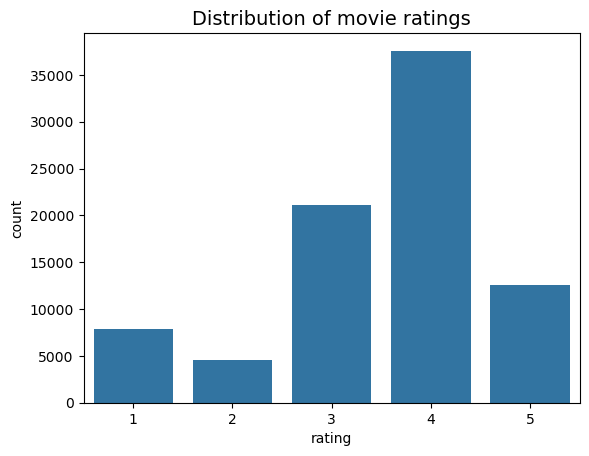

In [40]:
sns.countplot(x = 'rating', data = df_ratings)
plt.title("Distribution of movie ratings", fontsize=14)
plt.show()

In [63]:
from scipy.sparse import csr_matrix

def create_X(df):
    """
    Generates a sparse matrix from ratings dataframe.

    Args:
        df: pandas dataframe containing 3 columns (userId, movieId, rating)

    Returns:
        X: sparse matrix
        user_mapper: dict that maps user id's to user indices
        user_inv_mapper: dict that maps user indices to user id's
        movie_mapper: dict that maps movie id's to movie indices
        movie_inv_mapper: dict that maps movie indices to movie id's
    """
    M = df['userId'].nunique()
    N = df['movie_id'].nunique()
    user_mapper = dict(zip(np.unique(df["userId"]), list(range(M))))
    movie_mapper = dict(zip(np.unique(df["movie_id"]), list(range(N))))

    user_inv_mapper = dict(zip(list(range(M)), np.unique(df["userId"])))
    movie_inv_mapper = dict(zip(list(range(N)), np.unique(df["movie_id"])))

    user_index = [user_mapper[i] for i in df['userId']]
    item_index = [movie_mapper[i] for i in df['movie_id']]

    X = csr_matrix((df["rating"], (user_index,item_index)), shape=(M,N))

    return X, user_mapper, movie_mapper, user_inv_mapper, movie_inv_mapper

X, user_mapper, movie_mapper, user_inv_mapper, movie_inv_mapper = create_X(df_ratings)

In [67]:
X.shape

(300, 4800)

In [64]:
n_total = X.shape[0]*X.shape[1]
n_ratings = X.nnz
sparsity = n_ratings/n_total
print(f"Matrix sparsity: {round(sparsity*100,2)}%")

Matrix sparsity: 5.81%


In [72]:
user_r = X.getnnz(axis=1)
len(user_r)

300

In [66]:
print(f"Most active user rated {user_r.max()} movies.")
print(f"Least active user rated {user_r.min()} movies.")

Most active user rated 694 movies.
Least active user rated 51 movies.


In [70]:
n_ratings_per_movie = X.getnnz(axis=0)
len(n_ratings_per_movie)

4800

C:\Users\hp\AppData\Local\Temp\ipykernel_13400\1708698724.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(user_r, shade=True)
C:\Users\hp\AppData\Local\Temp\ipykernel_13400\1708698724.py:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(n_ratings_per_movie, shade=True)


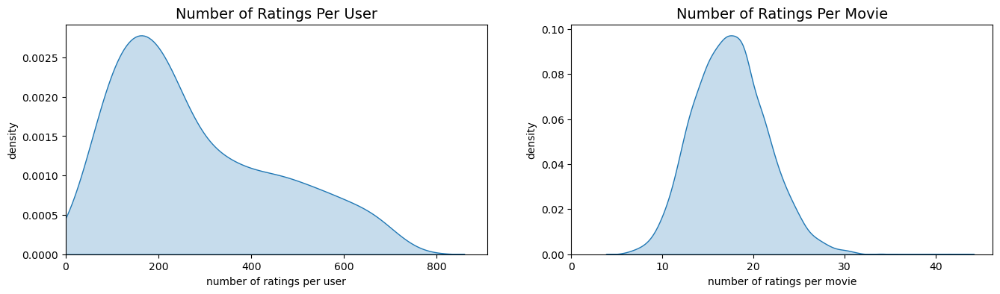

In [73]:
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
sns.kdeplot(user_r, shade=True)
plt.xlim(0)
plt.title("Number of Ratings Per User", fontsize=14)
plt.xlabel("number of ratings per user")
plt.ylabel("density")
plt.subplot(1,2,2)
sns.kdeplot(n_ratings_per_movie, shade=True)
plt.xlim(0)
plt.title("Number of Ratings Per Movie", fontsize=14)
plt.xlabel("number of ratings per movie")
plt.ylabel("density")
plt.show()

In [42]:
from sklearn.neighbors import NearestNeighbors

def knn_similar_users(userId, X, user_mapper, user_inv_mapper, k, metric='cosine'):
    """
    Finds k-nearest neighbours for a given movie id.

    Args:
        movie_id: id of the movie of interest
        X: user-item utility matrix
        k: number of similar movies to retrieve
        metric: distance metric for kNN calculations

    Output: returns list of k similar movie ID's
    """
    neighbour_ids = []

    user_index = user_mapper[userId]
    user_vector = X[user_index]
    if isinstance(user_vector, (np.ndarray)):
        user_vector = user_vector.reshape(1,-1)
    # use k+1 since kNN output includes the movieId of interest
    kNN = NearestNeighbors(n_neighbors=k+1, algorithm="brute", metric=metric)
    kNN.fit(X)
    neighbour = kNN.kneighbors(user_vector, return_distance=False)
    for i in range(0,k):
        n = neighbour.item(i)
        neighbour_ids.append(user_inv_mapper[n])
    neighbour_ids.pop(0)
    return neighbour_ids

In [43]:
similar_users = knn_similar_users(1,X,user_mapper,user_inv_mapper,k=10)

In [44]:
similar_users[0]

223

In [45]:
df1 = df_ratings.loc[df_ratings['userId']==1].sort_values(by='rating', ascending = False)
df2 = df_ratings.loc[df_ratings['userId']==235].sort_values(by='rating', ascending = False)

In [46]:
df2.nunique()

userId        1
movie_id    291
rating        5
dtype: int64

In [47]:
df_common_movies = pd.merge(df1, df2, on=['movie_id'], how='inner')
df_common_movies

,userId_x,movie_id,rating_x,userId_y,rating_y
0,1,2067,5,235,4
1,1,84355,5,235,4
2,1,302579,5,235,3
3,1,9012,5,235,4
4,1,22256,5,235,4
5,1,20309,4,235,4
6,1,576,4,235,5
7,1,2752,4,235,4
8,1,10808,4,235,4
9,1,10040,4,235,4


In [48]:
missing_movie_ids = set(df2['movie_id']) - set(df1['movie_id'])

# Convert the set to a list if needed
missing_movie_ids_list = list(missing_movie_ids)

In [49]:
missing_movie_ids = list(set(df2['movie_id']) - set(df1['movie_id']))
missing_movie_ids

[13824,
 335874,
 60420,
 23049,
 10762,
 34314,
 16911,
 1551,
 32275,
 250902,
 14359,
 238615,
 19995,
 540,
 10782,
 61984,
 35,
 2085,
 9767,
 244776,
 11818,
 209451,
 244267,
 364083,
 3635,
 9781,
 87093,
 5178,
 78394,
 32316,
 77883,
 257088,
 577,
 26688,
 66,
 18501,
 10312,
 10313,
 31306,
 29262,
 11342,
 4688,
 9297,
 138832,
 9806,
 11863,
 87,
 45145,
 89,
 11876,
 612,
 192102,
 105,
 228970,
 2667,
 217708,
 30315,
 9837,
 11375,
 2669,
 13938,
 627,
 347764,
 12405,
 118,
 2163,
 15992,
 1651,
 34941,
 11901,
 13950,
 136835,
 13448,
 94348,
 11404,
 9870,
 19084,
 8849,
 10388,
 5279,
 93856,
 9890,
 296098,
 31909,
 173224,
 1705,
 17578,
 56491,
 169,
 173,
 682,
 7347,
 118452,
 77495,
 25786,
 374461,
 124606,
 57022,
 9920,
 27845,
 8390,
 45767,
 10950,
 13001,
 76494,
 13006,
 4816,
 19153,
 20178,
 9427,
 279759,
 8922,
 34016,
 1248,
 18147,
 234212,
 227,
 10982,
 9955,
 1770,
 755,
 11507,
 11509,
 46838,
 10996,
 1272,
 9978,
 10490,
 251,
 199933,
 253

In [50]:
filtered_df = df_ratings[(df_ratings['userId'] == 193) & (df_ratings['movie_id'].isin(missing_movie_ids_list))].sort_values(by='rating',ascending=False)
# filtered_df.sort_values(by='rating',ascending=False)
filtered_df

,userId,movie_id,rating
53677,193,1958,5
53935,193,10017,5
53705,193,66,5
53707,193,577,5
53596,193,11588,4
53798,193,124606,4
54213,193,61984,4
54072,193,310131,4
54061,193,21801,4
53996,193,73567,4


In [51]:
movies = filtered_df.iloc[0:10,1:2]

In [52]:
movies['movie_id'].tolist()

[1958, 10017, 66, 577, 11588, 124606, 61984, 310131, 21801, 73567]

Cosine Similarity

In [53]:
from sklearn.metrics.pairwise import cosine_similarity

def find_similar_users(userId, X, user_mapper, user_inv_mapper, k):
    user_index = user_mapper[userId]
    user_vector = X[user_index].reshape(1, -1)
    
    similarity_scores = cosine_similarity(user_vector, X)
    sorted_indices = np.argsort(similarity_scores[0])[::-1]  # Sort indices by decreasing similarity
    
    # Exclude the target user from the list of neighbors
    neighbor_indices = sorted_indices[1:k+1]
    
    # Convert neighbor indices to user IDs
    neighbor_ids = [user_inv_mapper[index] for index in neighbor_indices]
    
    return neighbor_ids,sorted_indices


In [54]:
similar_ids, similarity_scores = find_similar_users(1,X,user_mapper, user_inv_mapper, k = 10)

In [55]:
similar_ids

[223, 243, 163, 228, 192, 67, 106, 2, 65, 242]

In [56]:
similarity_scores[0:20]

array([  0, 222, 242, 162, 227, 191,  66, 105,   1,  64, 241, 298, 289,
       180, 118,  56, 154,  41,  52, 246], dtype=int64)

Plot

In [57]:
# import numpy as np


# def plot_similar_users(similar_users, similarity_scores):
#     """
#     Plot similar users and their similarity scores.

#     Args:
#         similar_users: List of similar user IDs
#         similarity_scores: List of similarity scores corresponding to similar users
#     """
#     # Generate x-axis (user IDs)
#     users = range(1, len(similar_users) + 1)

#     # Plot similar users
#     plt.figure(figsize=(10, 6))
#     plt.scatter(users, similarity_scores, color='blue', label='Similarity Score')

#     # Add labels and title
#     plt.xlabel('User ID')
#     plt.ylabel('Similarity Score')
#     plt.title('Similar Users')

#     # Add user IDs as annotations
#     for user, score in zip(users, similarity_scores):
#         plt.annotate(str(similar_users[user - 1]), (user, score), textcoords="offset points", xytext=(0, 10), ha='center')

#     # Show legend
#     plt.legend()

#     # Show plot
#     plt.tight_layout()
#     plt.show()


# # Plot similar users
# plot_similar_users(similar_users, similarity_scores)


In [58]:
similar_users[0]

223

In [59]:
def recommended_movies(userId):
    similar_users = knn_similar_users(userId,X,user_mapper,user_inv_mapper,k=10)
    df1 = df_ratings.loc[df_ratings['userId'] == userId].sort_values(by='rating', ascending = False)
    df2 = df_ratings.loc[df_ratings['userId'] == similar_users[0]].sort_values(by='rating', ascending = False)
    movies_notseen = list(set(df2['movie_id']) - set(df1['movie_id']))
    filtered_df = df_ratings[(df_ratings['userId'] == 193) & (df_ratings['movie_id'].isin(movies_notseen))].sort_values(by='rating',ascending=False)
    movies = filtered_df.iloc[0:10,1:2]
    rec_movies = movies['movie_id'].tolist()
    return rec_movies
    
recommended_movies(1)

    

[11370, 15059, 361475, 17170, 12403, 14544, 18937, 22215, 9703, 380]

In [60]:
df_ratings.head()


,userId,movie_id,rating
0,1,171424,3
1,1,284,3
2,1,492,3
3,1,11678,5
4,1,9576,4


In [62]:
# from flask import Flask
# from flask_mysqldb import MySQL
# from flask import render_template, redirect, request, url_for, flash, session,request as flask_request
# import hashlib
# app = Flask(__name__)

# app.config['MYSQL_HOST'] = 'localhost'
# app.config['MYSQL_USER'] = 'root'
# app.config['MYSQL_PASSWORD'] = '@gArwal80okD3p0rt'
# app.config['MYSQL_DB'] = 'movie_rec'

# app.config['MYSQL_CURSORCLASS'] = 'DictCursor'

# app.secret_key = 'your_secret_key'

# mysql = MySQL(app)

# @app.route('/')
# def register():
#     for index, row in df_ratings.iterrows():
#         userId = row['userId']
#         movie_id = row['movie_id']
#         rating = row['rating']
#         try:
#             cur = mysql.connection.cursor()
#             cur.execute("INSERT INTO ratings (userId, movie_id, rating) VALUES (%s, %s, %s)",
#                         (int(userId), int(movie_id), int(rating)))
#             mysql.connection.commit()
#             cur.close()

#             flash('Registration successful. You can now login.', 'success')
#             return redirect(url_for('login'))
#         except Exception as e:
#             flash('Registration failed. Please try again later.', 'danger')
#             print(f"An error occurred during registration: {e}")
            
#     return render_template('register.html')

# if __name__ == "__main__":
#     app.run()

 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit


An error occurred during registration: Could not build url for endpoint 'login'. Did you mean 'register' instead?
An error occurred during registration: Could not build url for endpoint 'login'. Did you mean 'register' instead?
An error occurred during registration: Could not build url for endpoint 'login'. Did you mean 'register' instead?
An error occurred during registration: Could not build url for endpoint 'login'. Did you mean 'register' instead?
An error occurred during registration: Could not build url for endpoint 'login'. Did you mean 'register' instead?
An error occurred during registration: Could not build url for endpoint 'login'. Did you mean 'register' instead?
An error occurred during registration: Could not build url for endpoint 'login'. Did you mean 'register' instead?
An error occurred during registration: Could not build url for endpoint 'login'. Did you mean 'register' instead?
An error occurred during registration: Could not build url for endpoint 'login'. Did you

e:\Anaconda\envs\GG_2527\lib\site-packages\werkzeug\sansio\response.py:224: UserWarning: The 'session' cookie is too large: the value was 56555 bytes but the header required 26 extra bytes. The final size was 56581 bytes but the limit is 4093 bytes. Browsers may silently ignore cookies larger than this.
  dump_cookie(
127.0.0.1 - - [09/Mar/2024 20:52:51] "GET / HTTP/1.1" 200 -


In [ ]:
for index, row in df_ratings.head(5).iterrows():
        userId = row['userId']
        movie_id = row['movie_id']
        rating = row['rating']
        print(userId,movie_id,rating)

1 10220 3
1 27380 5
1 56715 4
1 46138 4
1 4967 3
